**CS-634: Data Mining - Midterm Project**  
**Student Name:** Benyamin Plaksienko  
**Instructor Name:** Yasser Abduallah  

---

**Project Title:**  
*Implementing Brute-Force Approach for Mining Association Rules  
and comparing it with the Apriori Principle Approach from a Python Library*

---
**Note: this program requires the following prereqs**

- **Python Version**: 3.8.20
- **Conda Version**: 24.11.3
- **Python Libraries**:

In [1]:
#-----------------------
#for Generating Datasets and Data extraction
import random
import csv
#-----------------------
#for Apriori Principle Approach
!pip install mlxtend
from mlxtend.frequent_patterns import apriori, association_rules
from mlxtend.preprocessing import TransactionEncoder
import pandas as pd
#----------------------------------
#for testing
import time
import matplotlib.pyplot as plt
import numpy as np

# **Midterm Term Project Part 1:** Generating Datasets

## Python Dictionary for Item Storage
I created a Python dictionary to store all the items with their relevant stores. I used the example items and stores provided in the midterm module. The seed value dictionary removes the random factor from `random`, ensuring the same set of transactions is generated each time the code runs, making the results reproducible.

## Transaction Generation
I iterated through a dictionary of stores, calling the `generate_transactions` function for each store with its corresponding list of items and a unique seed value. This function selects a random number of items within a specified range from the list and returns a list of tuples, each containing a transaction ID and a comma-separated string of selected items. The seed value ensures reproducibility.

The generated transactions were saved as CSV files named after each store, and a confirmation message was printed after each function call.

## Customizing Transaction Parameters
You can modify the number of transactions or adjust the minimum/maximum range by changing the default values in the `generate_transactions` function. Also, you can modify the stores and store_seeds dictionary to modify stores and items and the pattern that they get outputed in the database. 



In [2]:
stores = {
    "Amazon": [
        "A Beginner’s Guide", "Java: The Complete Reference", "Java For Dummies",
        "Android Programming: The Big Nerd Ranch", "Head First Java 2nd Edition",
        "Beginning Programming with Java", "Java 8 Pocket Guide",
        "C++ Programming in Easy Steps", "Effective Java (2nd Edition)",
        "HTML and CSS: Design and Build Websites"
    ],
    "Best_Buy": [
        "Digital Camera", "Lab Top", "Desk Top", "Printer", "Flash Drive",
        "Microsoft Office", "Speakers", "Lab Top Case", "Anti-Virus", "External Hard-Drive"
    ],
    "K-Mart": [
        "Quilts", "Bedspreads", "Decorative Pillows", "Bed Skirts", "Sheets",
        "Shams", "Bedding Collections", "Kids Bedding", "Embroidered Bedspread", "Towels"
    ],
    "Nike": [
        "Running Shoe", "Soccer Shoe", "Socks", "Swimming Shirt", "Dry Fit V-Nick",
        "Rash Guard", "Sweatshirts", "Hoodies", "Tech Pants", "Modern Pants"
    ],
    "Generic": ["A", "B", "C", "D", "E", "F"]
}

store_seeds = {
    "Amazon": 69,
    "Best_Buy": 420,
    "K-Mart": 690,
    "Nike": 4200,
    "Generic": 6900
}



def generate_transactions(item_list, seed_value, num_transactions=20, min_items=1, max_items=10):
    random.seed(seed_value)
    transactions = []
    for i in range(1, num_transactions + 1):
        max_possible_items = min(max_items, len(item_list)) 
        num_items = random.randint(min_items, max_possible_items) 
        selected_items = random.sample(item_list, num_items)
        transactions.append((f"Trans{i}", ", ".join(selected_items)))
    return transactions


for store, items in stores.items():
    seed_value = store_seeds[store]
    transactions = generate_transactions(items, seed_value)

    
    with open(f"{store}_transactions.csv", "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["Transaction ID", "Transaction"])
        writer.writerows(transactions)

    print(f"Generated transactions for {store} (Seed: {seed_value})")

Generated transactions for Amazon (Seed: 69)
Generated transactions for Best_Buy (Seed: 420)
Generated transactions for K-Mart (Seed: 690)
Generated transactions for Nike (Seed: 4200)
Generated transactions for Generic (Seed: 6900)


# **Midterm Term Project Part 2:** Brute-Force Approach for Mining Association Rules

## Extracting Transactions and Items  
The `extract_transactions_and_items` function processes a CSV file, where each row represents a transaction. It extracts the items in each transaction as a set while also gathering all unique items across all transactions.  

The function returns a tuple consisting of:  
- A list of transactions, where each transaction is a set of items.  
- A list of unique items found throughout the dataset.  


In [3]:
def extract_transactions_and_items(csv_file):
    transactions = []
    item_set = set()
    with open(csv_file, newline='', encoding='utf-8', errors='replace') as file:
        reader = csv.reader(file)
        next(reader)  
        for row in reader:
            items = set(item.strip() for item in row[1].strip().split(','))
            transactions.append(items)
            item_set.update(items)
    return transactions, list(item_set)

## Prompt Selection and Threshold Input  

The `pick_store_and_support` function prompts the user to:  
- Select a store.  
- Input minimum support and confidence thresholds for transaction analysis.  

It includes defense mechanisms such as:  
- **Input validation** to ensure values are within the valid range (0.0 to 1.0).  
- **Error handling** for invalid inputs.  

The function returns:  
- The corresponding CSV file name.  
- The minimum support value.  
- The minimum confidence value.  


In [4]:
def pick_store_and_support():
    store_names = ["Amazon", "Best Buy", "K-Mart", "Nike", "Generic"]
    print("\nAvailable Stores:")
    for index, store in enumerate(store_names, start=1):
        print(f"{index}. {store}")

    store = get_valid_store_choice(store_names)
    min_support = get_valid_threshold("Enter the minimum support threshold (0.01 - 1.0): ")
    min_confidence = get_valid_threshold("Enter the minimum confidence threshold (0.01 - 1.0): ")
    print("\nYou selected:")
    print(f"Store: {store}")
    print(f"Minimum Support: {min_support}")
    print(f"Minimum Confidence: {min_confidence}")
    csv_file = f"{store}_transactions.csv"
    return csv_file, min_support, min_confidence


def get_valid_store_choice(store_names):
    while True:
        try:
            store_index = int(input("\nPlease select a store by number: ").strip())
            if 1 <= store_index <= len(store_names):
                return store_names[store_index - 1]
            else:
                print(f"Invalid selection. Please enter a number between 1 and {len(store_names)}.")
        except ValueError:
            print("Invalid input. Please enter a valid integer.")


def get_valid_threshold(prompt):
    while True:
        try:
            value = float(input(f"\n{prompt}").strip())
            if 0.01 <= value <= 1.0:
                return value
            print("Value must be between 0.01 and 1.0.")
        except ValueError:
            print("Invalid input. Please enter a numeric value between 0.01 and 1.0.")


### `generate_itemsets(items, k)` Function Overview  

The `generate_itemsets(items, k)` function is designed to generate all possible itemsets of a given size `k` from a list of unique items.  

#### **Parameters**  
- **`items`**: A list of unique elements.  
- **`k`**: The desired size of the itemsets to be generated.  

#### **Functionality**  
- It employs a **recursive backtracking approach** to systematically explore all possible combinations of `k` elements.  
- Each generated itemset is stored as a **set data structure**, ensuring uniqueness.  

#### **Usage**  
Within the **`brute_force_approach`** function, `generate_itemsets` is used to generate candidate itemsets at different levels, forming the foundation for further analysis.


In [5]:
def generate_itemsets(items, k):
    itemsets = []
    if k <= 0 or k > len(items):
        return itemsets
    generate_combinations(items, 0, [], k, itemsets)
    return itemsets

def generate_combinations(items, start, current_combination, k, itemsets):
    if len(current_combination) == k:
        itemsets.append(set(current_combination))
        return
    for i in range(start, len(items)):
        generate_combinations(items, i + 1, current_combination + [items[i]], k, itemsets)


### `calculate_support(transactions, itemset)` Function Overview  

The `calculate_support(transactions, itemset)` function calculates the **support** of a given itemset within a dataset by determining how frequently the itemset appears in the transactions.  

#### **Functionality**  
- It counts how many transactions contain all the items in the given itemset.  
- The **support** is then computed as the ratio of matching transactions to the total number of transactions.  
- If the dataset is empty, the function ensures a return value of **0** to handle edge cases.  
- The function uses `itemset.issubset(transaction)` to efficiently check for the presence of the itemset within each transaction.

#### **Support Formula**  

$$
\text{Support}(itemset) = \frac{\text{Count of transactions containing } itemset}{\text{Total number of transactions}}
$$  

#### **Usage**  
In the **brute-force approach**, `calculate_support` is employed to identify **frequent itemsets** by checking which item combinations meet the **minimum support** threshold.  


In [6]:
def calculate_support(transactions, itemset):
    itemset = set(itemset)
    count = sum(1 for transaction in transactions if itemset.issubset(transaction))
    return count / len(transactions) if len(transactions) > 0 else 0


### `generate_association_rules(frequent_itemsets, transactions, min_confidence)` Function

The `generate_association_rules` function identifies **association rules** from **frequent itemsets**, uncovering strong relationships between items based on their **confidence**.

#### **Key Concepts:**

- **Antecedent**: The items that appear first in the rule (left-hand side).
- **Consequent**: The items that tend to follow when the antecedent is present (right-hand side).

The function generates all possible subsets of each frequent itemset using a **backtracking** approach. Each subset is treated as a potential **antecedent**, with the remaining items forming the **consequent**.

#### **Confidence Calculation:**

The **confidence** of an association rule measures the likelihood that the consequent will appear when the antecedent is present. It is calculated using the following formula:

$$
\text{Confidence}(\text{antecedent} \rightarrow \text{consequent}) = \frac{\text{Support}(\text{antecedent} \cup \text{consequent})}{\text{Support}(\text{antecedent})}
$$

Where:
- **Support(antecedent ∪ consequent)** represents the frequency of the combined antecedent and consequent appearing in the dataset.
- **Support(antecedent)** is the frequency of the antecedent appearing in the dataset.

#### **Filtering Based on Confidence:**

Only rules with a confidence value greater than or equal to the **min_confidence** threshold are retained. This ensures that only the most meaningful and strong relationships are kept for further analysis.

#### **Return Value:**

The function returns a list of **association rules**, where each rule in dictionary contains:
- **Antecedent**: The items that lead to the consequent.
- **Consequent**: The items that are likely to appear after the antecedent.
- **Support**: The frequency of the rule's occurrence in the dataset.
- **Confidence**: The likelihood that the consequent will appear, given the antecedent.



In [7]:
def generate_association_rules(frequent_itemsets, transactions, min_confidence):
    rules = []   
    for itemset in frequent_itemsets.keys():
        if len(itemset) < 2:  
            continue  
        subsets = generate_all_subsets(itemset)
        for antecedent in subsets:
            consequent = itemset - antecedent  
            
            if not consequent:  
                continue
            

            support_antecedent_union_consequent = frequent_itemsets[itemset]
            support_antecedent = frequent_itemsets.get(frozenset(antecedent), calculate_support(transactions, antecedent))
            confidence = support_antecedent_union_consequent / support_antecedent if support_antecedent > 0 else 0
            if confidence >= min_confidence:
                rules.append({
                    'antecedent': antecedent, 
                    'consequent': consequent, 
                    'support': support_antecedent_union_consequent, 
                    'confidence': confidence
                })
    return rules
    
def backtrack(start, current_subset, item_list, subsets):
    if current_subset:
        subsets.append(frozenset(current_subset))  
    for i in range(start, len(item_list)):
        backtrack(i + 1, current_subset + [item_list[i]], item_list, subsets)

def generate_all_subsets(itemset):
    item_list = list(itemset)
    subsets = []
    backtrack(0, [], item_list, subsets)
    return subsets



# Brute Force Approach in Association Rule Mining

## Overview  
The **`brute_force_approach`** function implements the **brute force method** to systematically generate **frequent itemsets** and **association rules** by enumerating and checking all possible item combinations.

## Step-by-Step Execution  

1. **Extract Transactions and Items**  
   - The function begins by calling **`extract_transactions_and_items(csv_file)`**, which processes the dataset to retrieve:
     - The list of **transactions**  
     - The set of all **unique items**  

2. **Generating Itemsets**  
   - The function iterates through increasing itemset sizes:
     - **1-itemsets** → **30 total**  
     - **2-itemsets** → **435 total**  
     - **3-itemsets** → **4060 total**  
   - It uses **`generate_itemsets(items_list, k)`** to generate all possible **k-itemsets**.  

3. **Verifying Itemset & Rule Generation**  
   - To verify correctness, you can modify the code to work with **0 support and confidence**, ensuring that the maximum number of rules and itemsets are generated. (I show a test later in this notebook)

4. **Calculating Support**  
   - For each generated itemset, the function calls **`calculate_support(transactions_list, itemset)`** to compute the **support value**, by checking how many transactions contain the **entire itemset**.  
   - Only itemsets that **meet the `min_support` threshold** are stored in the **`all_frequent_itemsets`** dictionary.  
   - This ensures that only **frequent itemsets** are considered.

5. **Termination Condition**  
   - The process continues **until no new k-itemsets are frequent**, at which point the brute-force method **terminates** without generating **(k+1)-itemsets**.

6. **Generating Association Rules**  
   - Finally, the function calls **`generate_association_rules(all_frequent_itemsets, transactions_list, min_confidence)`**, which:
     - **Identifies** antecedent-consequent relationships in **frequent itemsets**  
     - **Ensures** only rules that meet the **min_confidence threshold** are considered  
     - **Provides** insights into **strong item relationships**  

## Output  
The **`brute_force_approach`** function returns:  
- A **dictionary** containing **all frequent itemsets**  
- A **list of association rules** that meet the **min_confidence**  
  - Each rule is represented as a **dictionary** with the following keys:  
    - **`antecedent`**  
    - **`consequent`**  
    - **`support`**  
    - **`confidence`**  


In [8]:
def brute_force_approach(csv_file, min_support, min_confidence):
    transactions_list, items_list = extract_transactions_and_items(csv_file) 
    all_frequent_itemsets = {}  

    for k in range(1, len(items_list) + 1):
        current_itemsets = generate_itemsets(items_list, k)
        new_frequent = {}  

        for itemset in current_itemsets:
            support = calculate_support(transactions_list, itemset)
            if support >= min_support:
                new_frequent[frozenset(itemset)] = support  

        if not new_frequent:  # If no new frequent itemsets were found, break the loop without generating (k+ 1 )-itemsets
            break

        all_frequent_itemsets.update(new_frequent)  

    association_rules = generate_association_rules(all_frequent_itemsets, transactions_list, min_confidence)
    return all_frequent_itemsets, association_rules
    











# *Function for printing both Brute-Force Approach for Mining Association Rules and Apriori Principle Approach results*

In [9]:
def approach_print(frequent_itemsets, rules):
    print("\nFrequent Itemsets:")
    for i, (itemset, support) in enumerate(frequent_itemsets.items(), 1):
        print(f"{i}. Itemset: {set(itemset)}, Support: {support:.4f}")
    
    print("\nAssociation Rules:")
    for i, rule in enumerate(rules, 1):
        print(f"{i}. Rule: {set(rule['antecedent'])} → {set(rule['consequent'])}, "
              f"Support: {rule['support']:.4f}, Confidence: {rule['confidence']:.4f}")

# Running the Code  

## Step 1: Select Store and Support  
Call **`pick_store_and_support()`**, which prompts the user to:  
- Choose a **CSV file**  
- Set **minimum support (min_support)**  
- Set **minimum confidence (min_confidence)**  

## Step 2: Execute the Brute Force Approach  
Pass the selected parameters into **`brute_force_approach()`** to get generated frequent itemsets and rules  

## Step 3: Print Approach

Use **`approach_print()`** to display the generated frequent itemsets and rules from **`brute_force_approach()`**



In [10]:
csv_file, min_support, min_confidence=pick_store_and_support()
frequent_itemsets, rules = brute_force_approach(csv_file, min_support, min_confidence)
approach_print(frequent_itemsets, rules)


Available Stores:
1. Amazon
2. Best Buy
3. K-Mart
4. Nike
5. Generic



Please select a store by number:  3

Enter the minimum support threshold (0.01 - 1.0):  .5

Enter the minimum confidence threshold (0.01 - 1.0):  .5



You selected:
Store: K-Mart
Minimum Support: 0.5
Minimum Confidence: 0.5

Frequent Itemsets:
1. Itemset: {'Sheets'}, Support: 0.5500
2. Itemset: {'Shams'}, Support: 0.6000
3. Itemset: {'Embroidered Bedspread'}, Support: 0.5000
4. Itemset: {'Kids Bedding'}, Support: 0.8000
5. Itemset: {'Decorative Pillows'}, Support: 0.5500
6. Itemset: {'Towels'}, Support: 0.6000
7. Itemset: {'Quilts'}, Support: 0.5500
8. Itemset: {'Bedspreads'}, Support: 0.7500
9. Itemset: {'Bedding Collections'}, Support: 0.5500
10. Itemset: {'Kids Bedding', 'Sheets'}, Support: 0.5000
11. Itemset: {'Bedspreads', 'Sheets'}, Support: 0.5000
12. Itemset: {'Bedspreads', 'Kids Bedding'}, Support: 0.6000
13. Itemset: {'Bedding Collections', 'Kids Bedding'}, Support: 0.5000
14. Itemset: {'Bedspreads', 'Towels'}, Support: 0.5500

Association Rules:
1. Rule: {'Kids Bedding'} → {'Sheets'}, Support: 0.5000, Confidence: 0.6250
2. Rule: {'Sheets'} → {'Kids Bedding'}, Support: 0.5000, Confidence: 0.9091
3. Rule: {'Bedspreads'} → {

### **Test for 0 Support and Confidence Calculation to see if Correct Output**

I performed a test to verify the generation of itemsets and association rules when both support and confidence are 0.

#### **Dataset Used:**
- **Amazon_transactions.csv**, which contains 10 items.

#### **Itemsets Calculation:**
Given that we have 10 items, the total number of possible non-empty itemsets is calculated as:

$$
2^{10} - 1 = 1023
$$

Thus, **1023 itemsets** should be generated, which matches the result I obtained.

#### **Association Rules Calculation:**
The number of possible association rules is calculated using the formula:

$$
3^{10} - 2^{(10+1)} + 1 = 57002
$$

Therefore, **57002 rules** should be generated, which is also the result I obtained.


In [13]:
frequent_itemsets, rules = brute_force_approach('Amazon_transactions.csv', 0, 0)
approach_print(frequent_itemsets, rules)


Frequent Itemsets:
1. Itemset: {'Java: The Complete Reference'}, Support: 0.7500
2. Itemset: {'Java For Dummies'}, Support: 0.6000
3. Itemset: {'C++ Programming in Easy Steps'}, Support: 0.5000
4. Itemset: {'Effective Java (2nd Edition)'}, Support: 0.5500
5. Itemset: {'Java 8 Pocket Guide'}, Support: 0.6500
6. Itemset: {'HTML and CSS: Design and Build Websites'}, Support: 0.5000
7. Itemset: {'Head First Java 2nd Edition'}, Support: 0.4500
8. Itemset: {'Beginning Programming with Java'}, Support: 0.6500
9. Itemset: {'Android Programming: The Big Nerd Ranch'}, Support: 0.4500
10. Itemset: {'A Beginner�s Guide'}, Support: 0.3500
11. Itemset: {'Java: The Complete Reference', 'Java For Dummies'}, Support: 0.4500
12. Itemset: {'Java: The Complete Reference', 'C++ Programming in Easy Steps'}, Support: 0.3000
13. Itemset: {'Java: The Complete Reference', 'Effective Java (2nd Edition)'}, Support: 0.5000
14. Itemset: {'Java: The Complete Reference', 'Java 8 Pocket Guide'}, Support: 0.5500
15. I

# **Midterm Term Project Part 3:** Apriori Principle Approach from a Python Library and Testing 

# Apriori Principle Approach  

The `apriori_principle_approach()` function applies the **Apriori algorithm** to extract frequent itemsets and generate association rules from a CSV file.  

## Steps  

### 1. Extract Transactions  
- Reads the CSV file and retrieves transactional data.  
- Converts transactions into a binary format using `TransactionEncoder`.  

### 2. Identify Frequent Itemsets  
- Uses the `apriori()` function to find itemsets that meet the **minimum support** threshold.  
- Stores results in a dictionary where keys are itemsets and values are support values.  

### 3. Generate Association Rules  
- Calls `association_rules()` to extract rules that meet the **minimum confidence** threshold.  
- Each rule contains:  
  - **Antecedent** → Items that imply another item  
  - **Consequent** → The implied item(s)  
  - **Support** → How often the rule appears in transactions  
  - **Confidence** → The likelihood of the consequent given the antecedent  

### 4. Return Values  
- **Frequent itemsets** dictionary with support values.  
- **List of association rules**, each stored as a dictionary.  
- If no frequent itemsets are found, the function returns empty set or list  


In [11]:
def apriori_principle_approach(csv_file, min_support, min_confidence):
    transactions_list, _ = extract_transactions_and_items(csv_file)
    te = TransactionEncoder()
    te_ary = te.fit(transactions_list).transform(transactions_list)
    df = pd.DataFrame(te_ary, columns=te.columns_)

    try:
        frequent_itemsets = apriori(df, min_support=min_support, use_colnames=True)
        if frequent_itemsets.empty:
            raise ValueError("The input DataFrame `df` containing the frequent itemsets is empty.")

        rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=min_confidence)
        frequent_itemsets_dict = {frozenset(itemset): support for itemset, support in 
                                  zip(frequent_itemsets['itemsets'], frequent_itemsets['support'])}
        rules_list = [
            {
                "antecedent": frozenset(rule['antecedents']),
                "consequent": frozenset(rule['consequents']),
                "support": rule['support'],
                "confidence": rule['confidence']
            }
            for _, rule in rules.iterrows()
        ]
        return frequent_itemsets_dict, rules_list

    except ValueError:
        #print("No frequent itemsets found. Returning empty results.")
        return {}, []


# Running the Code  

## Step 1: Select Store and Support  
Call **`pick_store_and_support()`**, which prompts the user to:  
- Choose a **CSV file**  
- Set **minimum support (min_support)**  
- Set **minimum confidence (min_confidence)**  

## Step 2: Execute the Brute Force Approach  
Pass the selected parameters into **`apriori_principle_approach()`** to get generated frequent itemsets and rules  

## Step 3: Print Approach

Use **`approach_print()`** to display the generated frequent itemsets and rules from **`apriori_principle_approach()`**

m

In [12]:
csv_file, min_support, min_confidence = pick_store_and_support()
frequent_itemsets, rules = apriori_principle_approach(csv_file, min_support, min_confidence)
approach_print(frequent_itemsets, rules)


Available Stores:
1. Amazon
2. Best Buy
3. K-Mart
4. Nike
5. Generic



Please select a store by number:  3

Enter the minimum support threshold (0.01 - 1.0):  .5

Enter the minimum confidence threshold (0.01 - 1.0):  .5



You selected:
Store: K-Mart
Minimum Support: 0.5
Minimum Confidence: 0.5

Frequent Itemsets:
1. Itemset: {'Bedding Collections'}, Support: 0.5500
2. Itemset: {'Bedspreads'}, Support: 0.7500
3. Itemset: {'Decorative Pillows'}, Support: 0.5500
4. Itemset: {'Embroidered Bedspread'}, Support: 0.5000
5. Itemset: {'Kids Bedding'}, Support: 0.8000
6. Itemset: {'Quilts'}, Support: 0.5500
7. Itemset: {'Shams'}, Support: 0.6000
8. Itemset: {'Sheets'}, Support: 0.5500
9. Itemset: {'Towels'}, Support: 0.6000
10. Itemset: {'Kids Bedding', 'Bedding Collections'}, Support: 0.5000
11. Itemset: {'Kids Bedding', 'Bedspreads'}, Support: 0.6000
12. Itemset: {'Bedspreads', 'Sheets'}, Support: 0.5000
13. Itemset: {'Towels', 'Bedspreads'}, Support: 0.5500
14. Itemset: {'Kids Bedding', 'Sheets'}, Support: 0.5000

Association Rules:
1. Rule: {'Kids Bedding'} → {'Bedding Collections'}, Support: 0.5000, Confidence: 0.6250
2. Rule: {'Bedding Collections'} → {'Kids Bedding'}, Support: 0.5000, Confidence: 0.9091
3

# TESTING

## Are the results the same for both Brute-Force Approach for Mining Association Rules and the Apriori Principle Approach from a Python Library?

In [13]:
def test_single(csv_file, min_support, min_confidence):
    frequent_itemsets_brute_force, rules_brute_force = brute_force_approach(csv_file, min_support, min_confidence)
    frequent_itemsets_apriori, rules_apriori = apriori_principle_approach(csv_file, min_support, min_confidence)
    if frequent_itemsets_brute_force == frequent_itemsets_apriori:
        print("Frequent itemsets match!")
        itemsets_match = True
    else:
        print("Frequent itemsets do NOT match!")
        itemsets_match = False
        
    brute_rules_set = {
        (frozenset(rule['antecedent']), frozenset(rule['consequent']), rule['confidence'])
        for rule in rules_brute_force
    }
    apriori_rules_set = {
        (frozenset(rule['antecedent']), frozenset(rule['consequent']), rule['confidence'])
        for rule in rules_apriori
    }

    if brute_rules_set == apriori_rules_set:
        print("Association rules match!")
        rules_match = True
    else:
        print("Association rules do NOT match!")
        rules_match = False
    return itemsets_match and rules_match


csv_file, min_support, min_confidence = pick_store_and_support()
test_single(csv_file, min_support, min_confidence)


Available Stores:
1. Amazon
2. Best Buy
3. K-Mart
4. Nike
5. Generic



Please select a store by number:  3

Enter the minimum support threshold (0.01 - 1.0):  .5

Enter the minimum confidence threshold (0.01 - 1.0):  .5



You selected:
Store: K-Mart
Minimum Support: 0.5
Minimum Confidence: 0.5
Frequent itemsets match!
Association rules match!


True

## Lets test it on alot of examples with all different stores and support and confidence values to see if the same result happens

In [14]:
support_values = np.arange(0.01, 1.01, 0.25).round(2)
confidence_values = np.arange(0.01, 1.01, 0.25).round(2)
stores = ["Amazon", "Best_Buy", "K-Mart", "Nike", "Generic"]
all_tests_true = True
for store in stores:
    csv_file = f"{store.replace(' ', '_')}_transactions.csv"
    for min_support in support_values:
        for min_confidence in confidence_values:
            result = test_single(csv_file, min_support, min_confidence)
            if not result:
                all_tests_true = False
                break 
        if not all_tests_true:
            break  
if all_tests_true:
    print("All Match")
else:
    print("Not All Match")

Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!
Frequent itemsets match!
Association rules match!


## From my results all the results for both Brute-Force Approach for Mining Association Rules and the Apriori Principle Approach from a Python Library are the same.

# Testing for Timing Performance 


# This is code that plots both algorithms execution time as the support increases, and displays the results

In [21]:
 def compare_algorithms_execution_time_based_on_changing_support(steps, csv_file):
    support_values = np.arange(0.01, 1.01, steps)  
    fixed_confidence = 0.01  
    brute_force_times = []
    apriori_times = []

    for min_support in support_values:
        # Measure time for Brute Force
        start_time = time.time()
        brute_force_approach(csv_file, min_support, fixed_confidence)
        brute_force_times.append(time.time() - start_time)
        

        # Measure time for Apriori
        start_time = time.time()
        apriori_principle_approach(csv_file, min_support, fixed_confidence)
        apriori_times.append(time.time() - start_time)
        

    # ----Plot the results --------------------------------------------
    plt.figure(figsize=(10, 5))
    plt.plot(support_values, brute_force_times, label="Brute Force", marker="o", linestyle="--", color="red")
    plt.plot(support_values, apriori_times, label="Apriori", marker="s", linestyle="-", color="blue")
    plt.xlabel("Minimum Support")
    plt.ylabel("Execution Time (seconds)")
    plt.title("Execution Time vs. Support for Brute Force and Apriori")
    plt.legend()
    plt.grid(True)
    plt.show()
    return brute_force_times, apriori_times
     
def print_execution_times(support_values, brute_force_times, apriori_times):
    print(f"{'Support Value':<15}{'Brute Force Time (s)':<25}{'Apriori Time (s)'}")
    print("-" * 55)  
    for i in range(len(support_values)):
        print(f"{support_values[i]:<15.2f}{brute_force_times[i]:<25.5f}{apriori_times[i]:.5f}")





**Test using Amazon with 0.01 step pace from .01 to 1**

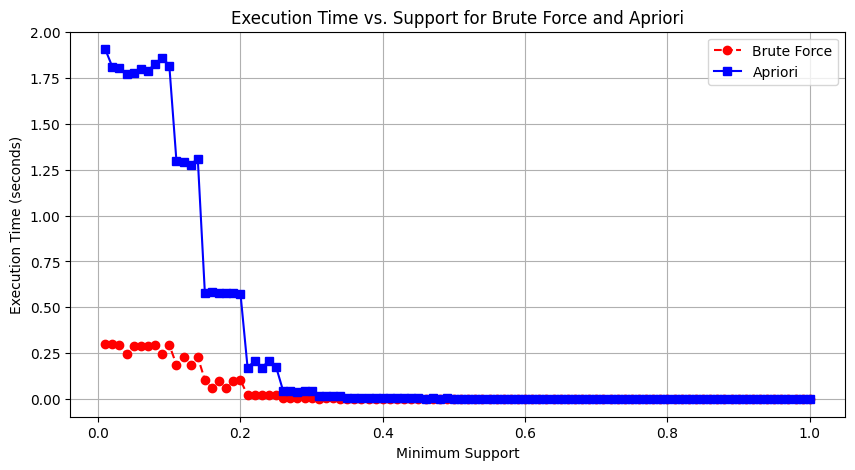

Support Value  Brute Force Time (s)     Apriori Time (s)
-------------------------------------------------------
0.01           0.30050                  1.90533
0.02           0.30205                  1.80857
0.03           0.29620                  1.80255
0.04           0.24365                  1.76948
0.05           0.29226                  1.77508
0.06           0.28936                  1.79920
0.07           0.28767                  1.78750
0.08           0.29287                  1.82734
0.09           0.24518                  1.85958
0.10           0.29512                  1.81612
0.11           0.18846                  1.29848
0.12           0.22930                  1.29142
0.13           0.18386                  1.27746
0.14           0.22934                  1.30974
0.15           0.10480                  0.57703
0.16           0.06059                  0.58203
0.17           0.10120                  0.57574
0.18           0.06026                  0.57612
0.19           0.09959 

In [23]:
brute_force_times, apriori_times=compare_algorithms_execution_time_based_on_changing_support(0.01, 'Amazon_transactions.csv')
support_values = np.arange(0.01, 1.01, 0.01) 
print_execution_times(support_values, brute_force_times, apriori_times)

**Test using Generic with 0.01 step pace from .01 to 1**

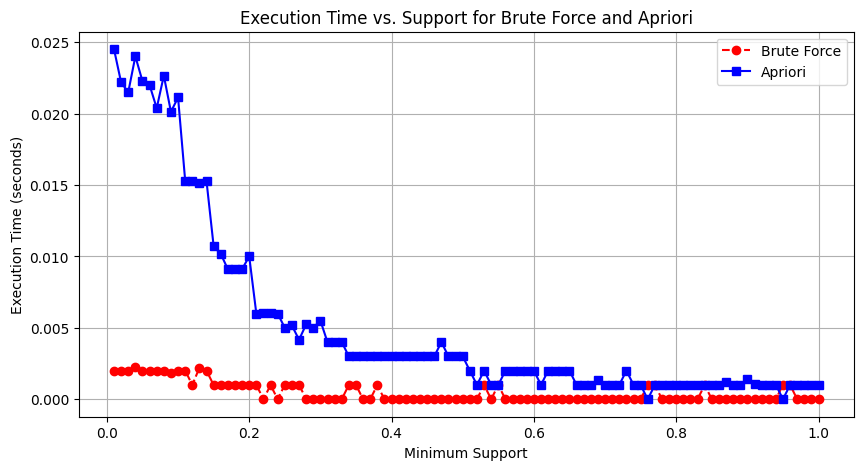

Support Value  Brute Force Time (s)     Apriori Time (s)
-------------------------------------------------------
0.01           0.00200                  0.02451
0.02           0.00199                  0.02218
0.03           0.00200                  0.02150
0.04           0.00228                  0.02401
0.05           0.00200                  0.02227
0.06           0.00200                  0.02200
0.07           0.00200                  0.02038
0.08           0.00200                  0.02266
0.09           0.00181                  0.02013
0.10           0.00200                  0.02113
0.11           0.00201                  0.01531
0.12           0.00100                  0.01526
0.13           0.00220                  0.01512
0.14           0.00200                  0.01527
0.15           0.00099                  0.01072
0.16           0.00100                  0.01018
0.17           0.00100                  0.00910
0.18           0.00101                  0.00910
0.19           0.00100 

In [25]:
brute_force_times, apriori_times=compare_algorithms_execution_time_based_on_changing_support(0.01, 'Generic_transactions.csv')
support_values = np.arange(0.01, 1.01, 0.01) 
print_execution_times(support_values, brute_force_times, apriori_times)

**Test using Best Buy with 0.01 step pace from .01 to 1**

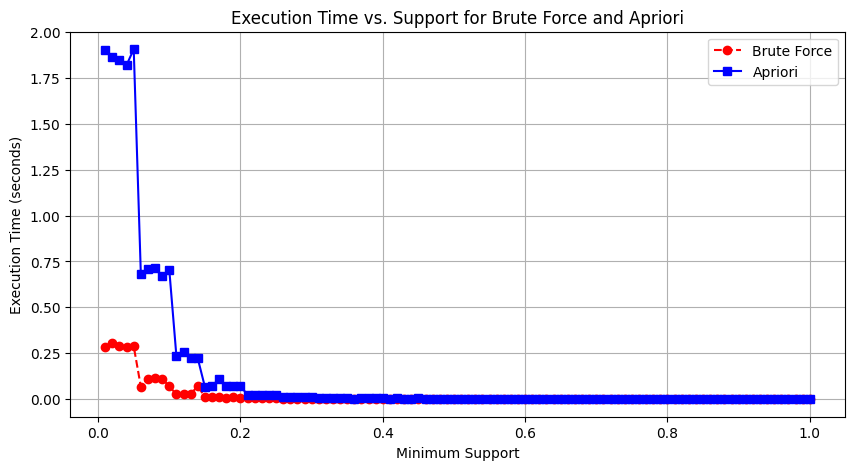

Support Value  Brute Force Time (s)     Apriori Time (s)
-------------------------------------------------------
0.01           0.28472                  1.89989
0.02           0.30656                  1.86334
0.03           0.29220                  1.84589
0.04           0.28260                  1.81949
0.05           0.28763                  1.90521
0.06           0.06849                  0.68207
0.07           0.11199                  0.70648
0.08           0.11417                  0.71637
0.09           0.11183                  0.66828
0.10           0.06958                  0.70291
0.11           0.02665                  0.23337
0.12           0.02614                  0.25911
0.13           0.02656                  0.22652
0.14           0.07334                  0.22213
0.15           0.01007                  0.06756
0.16           0.01007                  0.07309
0.17           0.01019                  0.10889
0.18           0.00934                  0.07056
0.19           0.01124 

In [27]:
brute_force_times, apriori_times=compare_algorithms_execution_time_based_on_changing_support(0.01, 'Best_Buy_transactions.csv')
support_values = np.arange(0.01, 1.01, 0.01) 
print_execution_times(support_values, brute_force_times, apriori_times)

**Test using K mart with 0.01 step pace from .01 to 1**

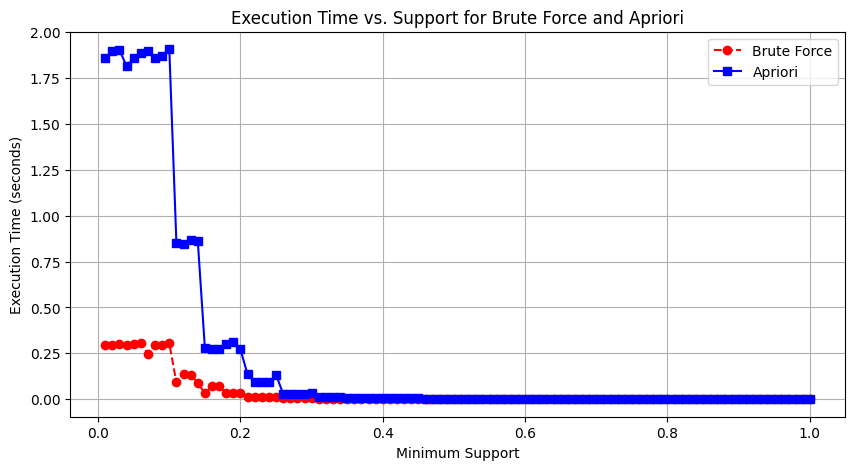

Support Value  Brute Force Time (s)     Apriori Time (s)
-------------------------------------------------------
0.01           0.29549                  1.85982
0.02           0.29446                  1.89808
0.03           0.30300                  1.90099
0.04           0.29348                  1.81421
0.05           0.29998                  1.85667
0.06           0.30412                  1.88400
0.07           0.24853                  1.89663
0.08           0.29427                  1.85598
0.09           0.29262                  1.87180
0.10           0.30363                  1.90613
0.11           0.09122                  0.84921
0.12           0.13467                  0.84293
0.13           0.13251                  0.86500
0.14           0.08860                  0.86247
0.15           0.03268                  0.27858
0.16           0.07043                  0.27231
0.17           0.07144                  0.27587
0.18           0.03223                  0.30016
0.19           0.03247 

In [28]:
brute_force_times, apriori_times=compare_algorithms_execution_time_based_on_changing_support(0.01, 'K-Mart_transactions.csv')
support_values = np.arange(0.01, 1.01, 0.01) 
print_execution_times(support_values, brute_force_times, apriori_times)

**Test using Nike with 0.01 step pace from .01 to 1**

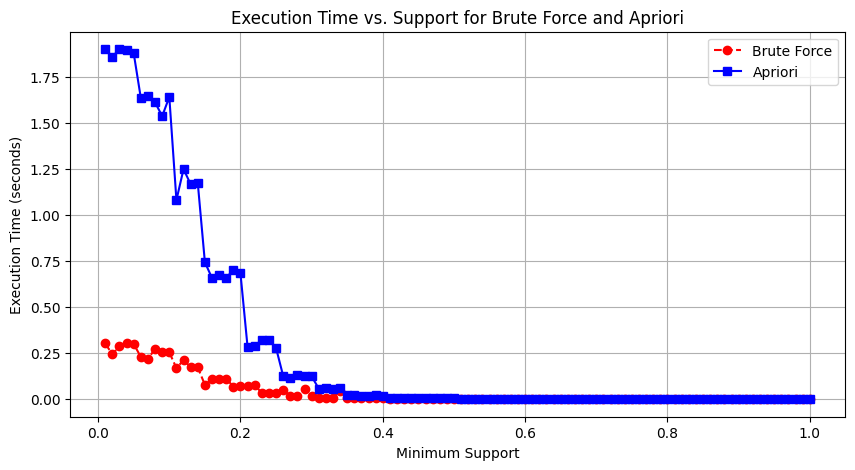

Support Value  Brute Force Time (s)     Apriori Time (s)
-------------------------------------------------------
0.01           0.30247                  1.89908
0.02           0.24348                  1.85920
0.03           0.28939                  1.89951
0.04           0.30445                  1.89686
0.05           0.30006                  1.87704
0.06           0.22908                  1.63421
0.07           0.21862                  1.64602
0.08           0.27372                  1.61119
0.09           0.25859                  1.53612
0.10           0.25478                  1.64054
0.11           0.16843                  1.08089
0.12           0.21241                  1.24884
0.13           0.17407                  1.16656
0.14           0.17291                  1.17344
0.15           0.07807                  0.74355
0.16           0.10743                  0.65774
0.17           0.10948                  0.67290
0.18           0.11160                  0.65841
0.19           0.06843 

In [29]:
brute_force_times, apriori_times=compare_algorithms_execution_time_based_on_changing_support(0.01, 'Nike_transactions.csv')
support_values = np.arange(0.01, 1.01, 0.01) 
print_execution_times(support_values, brute_force_times, apriori_times)

# As we can see, as the minimum support rises, both algorithms run faster. This is because the number of candidate itemsets that need to be checked decreases. However, Apriori tends to be slower at first because it generates and checks more candidate itemsets in the initial iterations compared to brute force. Once the minimum support is set high enough, Apriori benefits from pruning and becomes more efficient, eventually outperforming brute force in terms of speed sometimes.


# This is code that plots both algorithms execution time as the confidence increases, and displays the results

In [31]:
def compare_algorithms_execution_time_based_on_changing_confidence(steps, csv_file):
    confidence_values = np.arange(0.01, 1.01, steps)  
    fixed_support = 0.01  
    brute_force_times = []
    apriori_times = []

    for min_confidence in confidence_values:
        # Measure time for Brute Force
        start_time = time.time()
        brute_force_approach(csv_file, fixed_support, min_confidence)
        brute_force_times.append(time.time() - start_time)

        # Measure time for Apriori
        start_time = time.time()
        apriori_principle_approach(csv_file, fixed_support, min_confidence)
        apriori_times.append(time.time() - start_time)

    # ----Plot the results --------------------------------------------
    plt.figure(figsize=(10, 5))
    plt.plot(confidence_values, brute_force_times, label="Brute Force", marker="o", linestyle="--", color="red")
    plt.plot(confidence_values, apriori_times, label="Apriori", marker="s", linestyle="-", color="blue")
    plt.xlabel("Minimum Confidence")
    plt.ylabel("Execution Time (seconds)")
    plt.title("Execution Time vs. Confidence for Brute Force and Apriori")
    plt.legend()
    plt.grid(True)
    plt.show()
    return brute_force_times, apriori_times
def print_execution_times(Confidence_values, brute_force_times, apriori_times):
    print(f"{'Confidence Value':<15}{'Brute Force Time (s)':<25}{'Apriori Time (s)'}")
    print("-" * 55)  
    for i in range(len(Confidence_values)):
        print(f"{Confidence_values[i]:<15.2f}{brute_force_times[i]:<25.5f}{apriori_times[i]:.5f}")

**Test using Amazon with 0.01 step pace from .01 to 1**

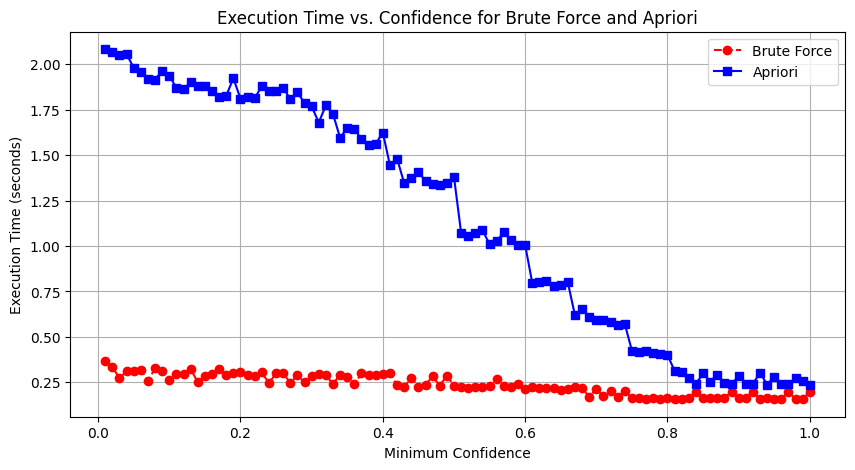

Confidence ValueBrute Force Time (s)     Apriori Time (s)
-------------------------------------------------------
0.01           0.36519                  2.08241
0.02           0.33336                  2.06443
0.03           0.27365                  2.05107
0.04           0.31078                  2.05383
0.05           0.31451                  1.98115
0.06           0.31725                  1.95518
0.07           0.26004                  1.91696
0.08           0.32682                  1.91569
0.09           0.31176                  1.96443
0.10           0.26023                  1.93654
0.11           0.29622                  1.86973
0.12           0.29475                  1.86510
0.13           0.32271                  1.90066
0.14           0.25137                  1.87804
0.15           0.28538                  1.88214
0.16           0.29646                  1.85296
0.17           0.32478                  1.81759
0.18           0.28770                  1.82693
0.19           0.30141

In [33]:
brute_force_times, apriori_times=compare_algorithms_execution_time_based_on_changing_confidence(0.01, 'Amazon_transactions.csv')
support_values = np.arange(0.01, 1.01, 0.01) 
print_execution_times(support_values, brute_force_times, apriori_times)

**Test using Best Buy with 0.01 step pace from .01 to 1**

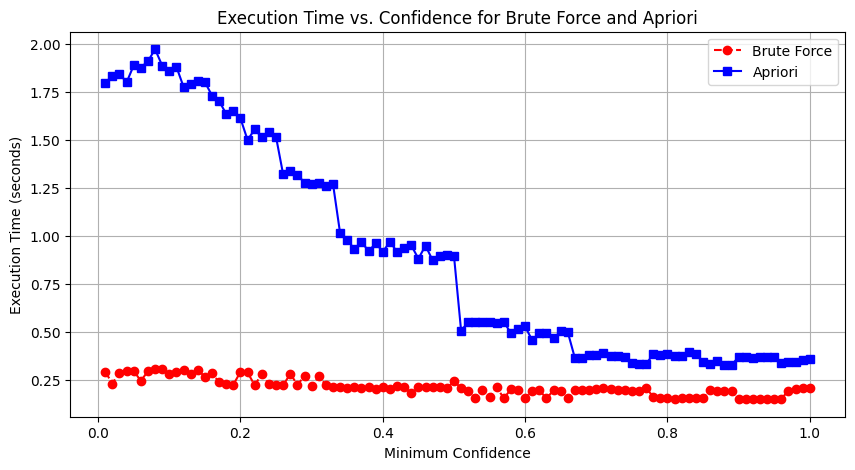

Confidence ValueBrute Force Time (s)     Apriori Time (s)
-------------------------------------------------------
0.01           0.29126                  1.79661
0.02           0.22949                  1.83550
0.03           0.28583                  1.84536
0.04           0.29366                  1.80048
0.05           0.29619                  1.88878
0.06           0.24298                  1.87730
0.07           0.29479                  1.91062
0.08           0.30310                  1.97312
0.09           0.30500                  1.88788
0.10           0.28002                  1.86009
0.11           0.28762                  1.88101
0.12           0.30030                  1.77735
0.13           0.27763                  1.78972
0.14           0.29914                  1.80494
0.15           0.26606                  1.80186
0.16           0.28259                  1.73172
0.17           0.23667                  1.70255
0.18           0.22985                  1.63550
0.19           0.22422

In [34]:
brute_force_times, apriori_times=compare_algorithms_execution_time_based_on_changing_confidence(0.01, 'Best_Buy_transactions.csv')
support_values = np.arange(0.01, 1.01, 0.01) 
print_execution_times(support_values, brute_force_times, apriori_times)

**Test using Kmart with 0.01 step pace from .01 to 1**

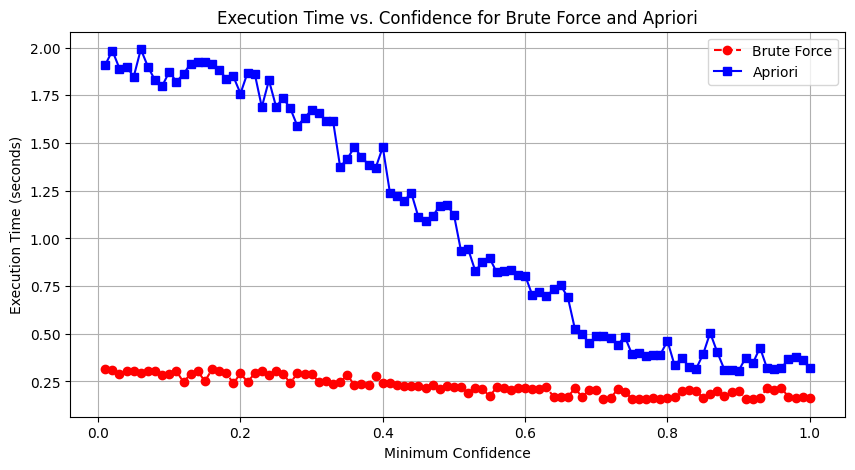

Confidence ValueBrute Force Time (s)     Apriori Time (s)
-------------------------------------------------------
0.01           0.31409                  1.91027
0.02           0.30742                  1.98453
0.03           0.29093                  1.89097
0.04           0.30489                  1.90029
0.05           0.30732                  1.84786
0.06           0.29429                  1.99209
0.07           0.30705                  1.89983
0.08           0.30678                  1.82912
0.09           0.28143                  1.79904
0.10           0.28936                  1.87419
0.11           0.30449                  1.82161
0.12           0.24538                  1.86220
0.13           0.29080                  1.91657
0.14           0.30361                  1.92277
0.15           0.25065                  1.92622
0.16           0.31366                  1.91506
0.17           0.30496                  1.88483
0.18           0.29548                  1.83724
0.19           0.23956

In [35]:
brute_force_times, apriori_times=compare_algorithms_execution_time_based_on_changing_confidence(0.01, 'K-Mart_transactions.csv')
support_values = np.arange(0.01, 1.01, 0.01) 
print_execution_times(support_values, brute_force_times, apriori_times)

**Test using Nike with 0.01 step pace from .01 to 1**

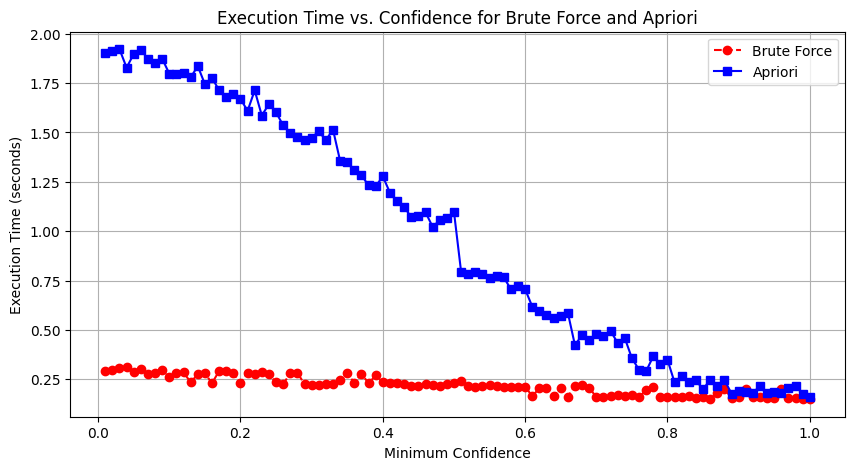

Confidence ValueBrute Force Time (s)     Apriori Time (s)
-------------------------------------------------------
0.01           0.29323                  1.90356
0.02           0.29932                  1.91484
0.03           0.30638                  1.92149
0.04           0.31045                  1.82823
0.05           0.28909                  1.89735
0.06           0.30251                  1.91892
0.07           0.27677                  1.87218
0.08           0.28050                  1.85357
0.09           0.29491                  1.87347
0.10           0.26251                  1.79745
0.11           0.28162                  1.79836
0.12           0.28516                  1.79993
0.13           0.23493                  1.77895
0.14           0.27538                  1.83583
0.15           0.28085                  1.74498
0.16           0.22989                  1.77546
0.17           0.29255                  1.71412
0.18           0.28968                  1.67942
0.19           0.28002

In [36]:
brute_force_times, apriori_times=compare_algorithms_execution_time_based_on_changing_confidence(0.01, 'Nike_transactions.csv')
support_values = np.arange(0.01, 1.01, 0.01) 
print_execution_times(support_values, brute_force_times, apriori_times)

**Test using Generic with 0.01 step pace from .01 to 1**

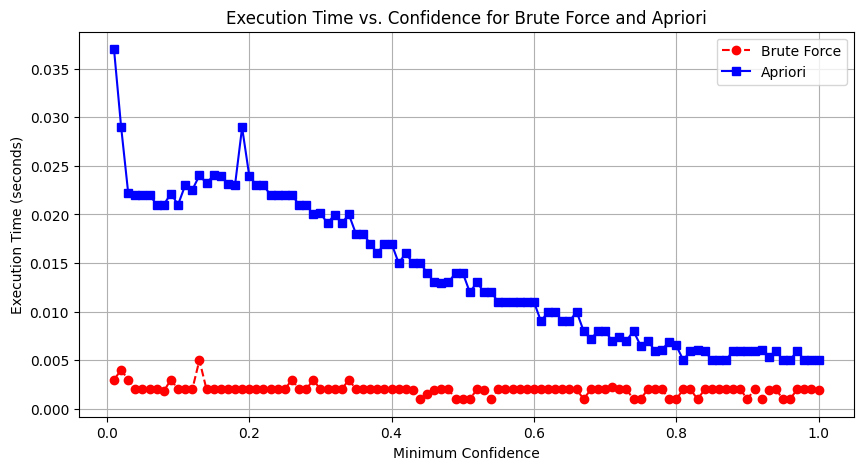

Confidence ValueBrute Force Time (s)     Apriori Time (s)
-------------------------------------------------------
0.01           0.00300                  0.03700
0.02           0.00400                  0.02901
0.03           0.00299                  0.02217
0.04           0.00200                  0.02201
0.05           0.00199                  0.02200
0.06           0.00200                  0.02201
0.07           0.00199                  0.02101
0.08           0.00183                  0.02101
0.09           0.00300                  0.02215
0.10           0.00200                  0.02100
0.11           0.00199                  0.02300
0.12           0.00200                  0.02253
0.13           0.00501                  0.02401
0.14           0.00200                  0.02323
0.15           0.00199                  0.02401
0.16           0.00200                  0.02399
0.17           0.00200                  0.02318
0.18           0.00199                  0.02300
0.19           0.00205

In [37]:
brute_force_times, apriori_times=compare_algorithms_execution_time_based_on_changing_confidence(0.01, 'Generic_transactions.csv')
support_values = np.arange(0.01, 1.01, 0.01) 
print_execution_times(support_values, brute_force_times, apriori_times)

# As we can see, as the minimum confidence rises, both algorithms run faster. This is because the number of candidate itemsets that need to be checked decreases. However, Apriori tends to be slower at first because it generates and checks more candidate itemsets in the initial iterations compared to brute force. Once the minimum confidence is set high enough, Apriori benefits from pruning and becomes more efficient, eventually outperforming brute force in terms of speed sometimes.


# Note from my testing with larger datasets its more obvious to see the pattern of apriori doing better than Brute-Force when there is a higher confidence or support